In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
from wordcloud import WordCloud

from ydata_profiling import ProfileReport

%matplotlib inline

pd.options.mode.chained_assignment = None  # default='warn'

# your code that triggers the warning goes here

pd.options.mode.chained_assignment = 'warn'  # set it back to the default value

In [9]:
 
# Specifying data types for columns while reading a CSV file
dtype_dict = {
    "case_type": "str",
    "account": "str",
    "created_by": "str",
    "business_service": "str",
    "assignment_group": "str",
    "auto_close": "bool",
    "impact": "str",
    "priority": "str",
    "urgency": "str",
    "created_by_cleaned": "str",
    "sla_has_breached": "bool", 
    "time_worked": "float", 
    "reassignment_count": "float",  
    "openedToClosed": "float",  
    "cluster": "category"  
}

# read csv file into dataframe
df = pd.read_csv('Data/data_withclusters.csv', dtype = dtype_dict)

# print shape of dataframe 
print(df.shape)
print(df.columns)
display(df)

(26714, 34)
Index(['number', 'closed', 'case', 'description', 'case_type', 'due_date',
       'first_response_time', 'opened', 'account', 'contact', 'created_by',
       'business_service', 'business_service_activity', 'assigned_to',
       'assignment_group', 'auto_close', 'time_worked', 'reassignment_count',
       'impact', 'priority', 'urgency', 'escalation', 'comments', 'case_cause',
       'cause', 'close_notes', 'resolution_code', 'problem',
       'business_percentage', 'sla_has_breached', 'duration', 'openedToClosed',
       'created_by_cleaned', 'cluster'],
      dtype='object')


C:\Users\Student\AppData\Local\Temp\ipykernel_7672\4042170074.py:21: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('Data/data_withclusters.csv', dtype = dtype_dict)


,number,closed,case,description,case_type,due_date,first_response_time,opened,account,contact,...,cause,close_notes,resolution_code,problem,business_percentage,sla_has_breached,duration,openedToClosed,created_by_cleaned,cluster
0,CS0011285,2020-11-03 08:21:44,Standardschrift Frutiger Light 47 CN​CS0011285,Hallo zusammen\r\r\r\n\r\r\r\nWir haben festge...,Request,NaN,NaN,2020-01-07 16:36:26,Ghelma AG Spezialtiefbau,Matthias Oesch,...,NaN,NaN,NaN,NaN,379.06,True,3500162,7215.755000,Unico,4
1,CS0011375,2020-11-10 09:30:01,Anzeigefehler in VDI​CS0011375,"Herr Marques meldet, dass alle Testuser auf de...",Request,NaN,NaN,2020-01-09 14:28:18,BKS Rechtsanwälte AG,Fabio Dias Marques,...,NaN,NaN,NaN,NaN,1445.90,True,14294890,7339.028611,Unico,4
2,CS0011381,2020-05-18 21:10:46,Herr Steiner - HP Notebook Docking Probleme​CS...,Hallo Nathanael\r\r\n\r\r\nNur so zur Info mei...,Trouble,NaN,2020-05-04 14:26:29,2020-01-09 16:32:00,Saphir Group Networks AG,Johan Kroeze,...,Workaround mit Windows Energy Einstellungen (K...,Workaround mit Windows Energy Einstellungen (K...,Solved – Fixed by Support/Guidance provided,NaN,105.62,True,527295,3124.646111,Unico,4
3,CS0011489,2020-06-01 12:30:03,Laptop schaltet sich nach 5 min aus (wenn nich...,NaN,Trouble,NaN,2020-01-27 11:25:54,2020-01-13 12:31:44,Amstutz Greuter Rechtsanwälte,Jasmin Mürner,...,Garantiefall,Das Gerät wurde an den Kunden zurückgesendet,Solved by Customer,NaN,548.15,True,2895069,3359.971944,Unico,4
4,CS0011676,2020-01-16 13:46:48,Herr Kunz hat mehrere Probleme bei der Ansicht...,1. Excel Dokumente können in Outlook nicht geö...,Request,NaN,NaN,2020-01-16 08:15:39,Ghelma AG Spezialtiefbau,NaN,...,NaN,1. Excel Dokumente können in Outlook nicht geö...,Solved – Fixed by Support/Guidance provided,NaN,9.48,False,18433,5.519167,Unico,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26709,CS0077175,2024-02-21 16:54:37,"Sharon Franzo, «Polypoint PEP» freischalten​CS...",Guten Tag\r\r\r\n\r\r\r\nKönnten Sie bitte auc...,Request,NaN,NaN,2024-02-20 16:25:38,Reliva AG,Sharon Franzo,...,NaN,NaN,NaN,NaN,0.93,False,1806,24.483056,Unico,6
26710,CS0077184,2024-02-21 08:14:16,"Salome Trachsel, Login issues, VDI​CS0077184",Wrong thin client message... closed and reopened,Request,NaN,NaN,2024-02-21 07:59:27,Siloah AG,Christina Sperling,...,NaN,NaN,NaN,NaN,0.01,False,28,0.246944,Unico,6
26711,CS0077188,2024-02-21 14:22:49,"Christoph Bürki, Zugriff Ordner: G:\Hotellerie...",Guten Tag\r\r\r\n\r\r\r\nBitte für @Schneider ...,Request,NaN,NaN,2024-02-21 08:26:06,Siloah Kühlewil AG,Christoph Buerki,...,NaN,NaN,NaN,NaN,10.87,False,21126,5.945278,Unico,6
26712,CS0077269,2024-02-22 16:31:46,"Brigitte Hager, Berechtigung für Laptop-Benutz...",Guten Tag\r\r\r\n\r\r\r\nWir drei Frauen in de...,Request,NaN,NaN,2024-02-22 15:59:37,Siloah Kühlewil AG,Brigitte Hager,...,NaN,NaN,NaN,NaN,0.39,False,766,0.535833,Unico,6


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Cluster 4


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'IT Operations'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.
To hide t

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 2


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Service Desk 1st Level'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 3


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Pathé Westside AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.
To hi

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 7


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Squad Platform'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.
To hide 

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 6


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Service Desk 1st Level'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 1


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Saphir Group Networks AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 5


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Service Desk 1st Level'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

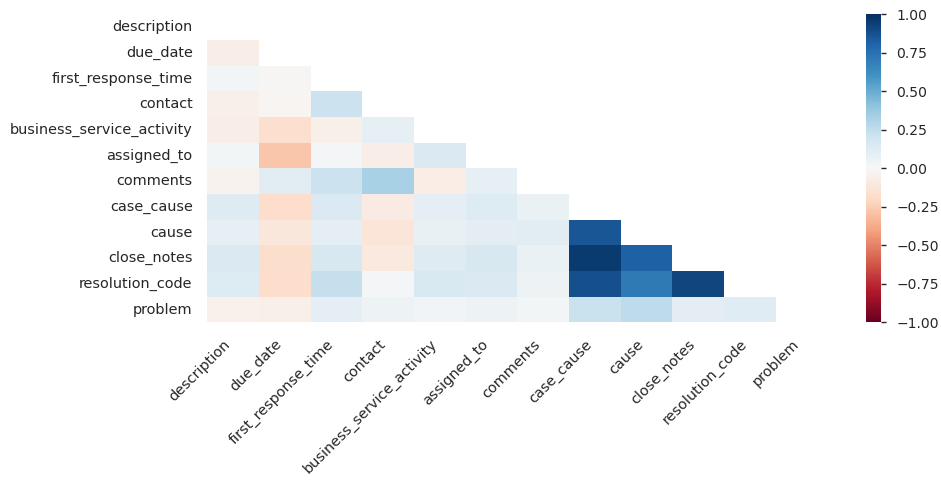

In [10]:
# For each Cluster to a Profile Report
for cluster in df['cluster'].unique():
    print(f"Cluster {cluster}")
    profile = ProfileReport(df[df['cluster'] == cluster], title=f"Profiling Report for Cluster {cluster}")
    profile.to_file(f"./html/Profiling Report for Cluster {cluster}.html")
# profile = ProfileReport(df, title="Profiling Report")
# profile.to_notebook_iframe()

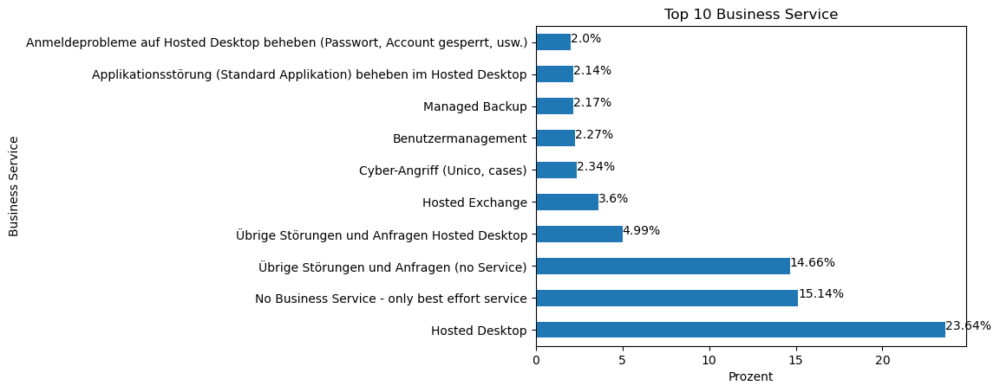

In [6]:
(df["business_service"].value_counts() / len(df) * 100).head(10).plot(kind = "barh")
# add procent value to bar
for index, value in enumerate((df["business_service"].value_counts() / len(df) * 100).head(10)):
    plt.text(value, index, str(round(value, 2)) + '%')
plt.title("Top 10 Business Service")
plt.xlabel("Prozent")
plt.ylabel("Business Service")
plt.show()

In [7]:
# displau Short Description (case), Description, Cause and close_notes
df_text = df[['case', 'description', 'cause', 'close_notes']]

# preprocess df_text columns 

display(df_text)

KeyError: "None of [Index(['case', 'description', 'cause', 'close_notes'], dtype='object')] are in the [columns]"

In [ ]:
def process_captions(data, column):
    data[column] = data[column].apply(lambda x: x.replace('\n', ' '))
    data[column] = data[column].apply(lambda x: x.replace('-', ' '))
    data[column] = data[column].apply(lambda x: x.lower())
    data[column] = data[column].apply(lambda x: re.sub('[^a-zA-Z0-9\s]', ' ', x))
    return data[column]

# change datatype of columns to string
df_text['case'] = df_text['case'].astype(str).copy()
df_text['description'] = df_text['description'].astype(str).copy()
df_text['cause'] = df_text['cause'].astype(str).copy()
df_text['close_notes'] = df_text['close_notes'].astype(str).copy()

df_text['case'] = process_captions(df_text, 'case').copy()
df_text['description'] = process_captions(df_text, 'description').copy()
df_text['cause'] = process_captions(df_text, 'cause').copy()
df_text['close_notes'] = process_captions(df_text, 'close_notes').copy()

display(df_text)

C:\Users\Student\AppData\Local\Temp\ipykernel_9368\3169275906.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_text['case'] = df_text['case'].astype(str).copy()
C:\Users\Student\AppData\Local\Temp\ipykernel_9368\3169275906.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_text['description'] = df_text['description'].astype(str).copy()
C:\Users\Student\AppData\Local\Temp\ipykernel_9368\3169275906.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Tr

,case,description,cause,close_notes
0,app002 laufwerk c fast voll cs0011089,liebes supportteam\r \r auf unserem virtuellen...,die ursache des problems war folgende \r\r kas...,kaspersky wurde neu installiert und die tempor...
1,herr l tolf kann sich nicht am phoenix anmelde...,gester hatte herr l tolf keine probleme im pho...,herr l tolf kann sich nicht am phoenix anmelden,der lieferant von phoenix hat gesehen dass de...
2,bug bei den atms cs0011091,kunden wollten ticket buchen f r 3d vorstellun...,,fehlten 3d brillengutscheine habe 100k erstel...
3,raisoft und epdok starten bei allen wefina sta...,herr bursic 076 582 24 02 meldete sich am 2 ...,bug in datenbank falsch formatierter datumsei...,manueller eingriff durch qsys n tig fernwartu...
4,vmware horizon desktop kann nicht gestartet we...,janos matyus 079 743 00 50 meldete sich kurz...,unbekannt,poweroff start chdcmirfc093
...,...,...,...,...
51415,daniel k mpfer kann mich nicht mehr von zu ha...,von zu hause aus kann ich mich nicht mehr mit ...,falscher pin verwendet,den richtigen pin benutzt
51416,salome trachsel login issues vdi cs0077184,wrong thin client message closed and reopened,nan,nan
51417,christoph b rki zugriff ordner g hotellerie...,guten tag\r\r \r\r bitte f r schneider reto u...,nan,nan
51418,brigitte hager berechtigung f r laptop benutz...,guten tag\r\r \r\r wir drei frauen in der admi...,nan,nan


In [ ]:
# export to parquet file
df_text.to_csv('Data/text_cleaned.csv')

In [ ]:
import requests

stopwords = requests.get("https://raw.githubusercontent.com/stopwords-iso/stopwords-de/master/stopwords-de.txt").text.split("\n")

from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(stop_words=stopwords)
tfidf.fit(df_text['case'])
tfidf.fit(df_text['description'])
tfidf.fit(df_text['cause'])
tfidf.fit(df_text['close_notes'])

TfidfVectorizer(stop_words=['a', 'ab', 'aber', 'ach', 'acht', 'achte', 'achten',
                            'achter', 'achtes', 'ag', 'alle', 'allein', 'allem',
                            'allen', 'aller', 'allerdings', 'alles',
                            'allgemeinen', 'als', 'also', 'am', 'an', 'ander',
                            'andere', 'anderem', 'anderen', 'anderer',
                            'anderes', 'anderm', 'andern', ...])

In [ ]:
tfidf.vocabulary_

# create tfidf.vocabulary_ into a dataframe 
df_tfidf = pd.DataFrame.from_dict(tfidf.vocabulary_, orient="index")
df_tfidf.sort_values(by=0, ascending=False)

index_dict = {v: k for k, v in tfidf.vocabulary_.items()}


df_tfidf = df_tfidf.reset_index()
df_tfidf.columns = ["word", "index"]
df_tfidf

top_words_i_list = []

num_top_words = 10
import tqdm
from tqdm import tqdm

for i, row in tqdm(df_text.iterrows()):

    #print("")
    #print("Ticket", i+1)
    #print("Top words per document:")
    # extract indices of top words
    top_words = sorted(
        list(enumerate(tfidf.transform([row["description"]]).toarray()[0])),
        key=lambda x: x[1],
        reverse=True,
    )[:num_top_words]

    # create empty list to store top words 
    top_words_i = []
    # print top words
    for word_index, word_score in top_words:
        #print(index_dict[word_index])
        top_words_i.append(index_dict[word_index])
    
    # append top words to top_words_i_list
    top_words_i_list.append(top_words_i)

    # break to only print first ticket
    #break

51420it [06:51, 124.94it/s]


In [ ]:
top_words_i_list[:10]

[['speicherplatz',
  'gb',
  'buerobass',
  'georg',
  'burkhalter',
  'installer',
  'windows',
  '41',
  'ch',
  '31'],
 ['gester',
  'phoenix',
  'arbeiten',
  'probleme',
  'herr',
  '00',
  '000',
  '0000',
  '00000002',
  '0000046d'],
 ['3d',
  'buchen',
  'anfang',
  'startmen',
  'ausw',
  'hlen',
  'ck',
  'kunden',
  'ticket',
  '00'],
 ['schmiedhof',
  'qsys',
  'sys',
  'tu',
  'tool',
  'nnen',
  'erfolgreichen',
  'rmehof',
  'testweise',
  'tswefi'],
 ['desktop',
  'vmware',
  'this',
  'janos',
  '079',
  'horizon',
  'contact',
  'assigned',
  'try',
  '50'],
 ['aktuell',
  'janos',
  '079',
  'kommunizieren',
  'priorit',
  'chef',
  'mobiltelefon',
  '50',
  'meldete',
  'beschreibung'],
 ['vpn',
  'meldung',
  'the',
  'krysiak',
  'operator9',
  'scheitert',
  'unable',
  'anmeldeversuch',
  'may',
  'meinte'],
 ['cksetzen',
  'rtern',
  'horizon',
  'aufruf',
  'kennw',
  'organisation',
  'ebene',
  'meldete',
  'vmware',
  'passwortwechsel'],
 ['verlangt',
  'me

In [ ]:
df_top_words = pd.DataFrame(columns=["top_10_words_each_ticket_description"])

df_top_words["top_10_words_each_ticket_description"] = top_words_i_list

df_top_words.reset_index(inplace=True)

display(df_top_words)

# rename columns
df_top_words.columns = ["number", "top_10_words_each_ticket_description"]

display(df_top_words)

,index,top_10_words_each_ticket_description
0,0,"[speicherplatz, gb, buerobass, georg, burkhalt..."
1,1,"[gester, phoenix, arbeiten, probleme, herr, 00..."
2,2,"[3d, buchen, anfang, startmen, ausw, hlen, ck,..."
3,3,"[schmiedhof, qsys, sys, tu, tool, nnen, erfolg..."
4,4,"[desktop, vmware, this, janos, 079, horizon, c..."
...,...,...
51415,51415,"[hause, aktuellen, anmelden, mail, passwort, 0..."
51416,51416,"[wrong, message, closed, thin, and, client, 00..."
51417,51417,"[siloah, hotellerie, christoph, 41, 31, 11, ch..."
51418,51418,"[hlewil, brigitte, siloah, hager, 31, kuehlewi..."


,number,top_10_words_each_ticket_description
0,0,"[speicherplatz, gb, buerobass, georg, burkhalt..."
1,1,"[gester, phoenix, arbeiten, probleme, herr, 00..."
2,2,"[3d, buchen, anfang, startmen, ausw, hlen, ck,..."
3,3,"[schmiedhof, qsys, sys, tu, tool, nnen, erfolg..."
4,4,"[desktop, vmware, this, janos, 079, horizon, c..."
...,...,...
51415,51415,"[hause, aktuellen, anmelden, mail, passwort, 0..."
51416,51416,"[wrong, message, closed, thin, and, client, 00..."
51417,51417,"[siloah, hotellerie, christoph, 41, 31, 11, ch..."
51418,51418,"[hlewil, brigitte, siloah, hager, 31, kuehlewi..."


In [ ]:
# concat df with df_top_words["top_10_words_each_ticket"]
df_enhance = pd.concat([df, df_top_words["top_10_words_each_ticket_description"]], axis=1)
display(df_enhance)

,number,closed,case,description,case_type,due_date,first_response_time,opened,account,contact,...,comments,case_cause,cause,close_notes,resolution_code,problem,business_percentage,sla_has_breached,duration,top_10_words_each_ticket_description
0,CS0011089,2020-01-13 08:38:02,APP002 - Laufwerk C fast voll!​CS0011089,Liebes Supportteam\r\n\r\nAuf unserem virtuell...,Request,NaN,2020-01-02 15:31:45,2020-01-01 06:30:43,Bass AG,Georg Burkhalter,...,10-01-2020 06:37:34 - gebu@buerobass (Addition...,NaN,Die Ursache des Problems war folgende.\r\r\nKa...,Kaspersky wurde neu installiert und die Tempor...,Solved – Fixed by Support/Guidance provided,NaN,0.00,False,116565.0,"[speicherplatz, gb, buerobass, georg, burkhalt..."
1,CS0011090,2020-01-01 09:41:19,Herr Lütolf kann sich nicht am Phoenix anmelde...,Gester hatte Herr Lütolf keine Probleme im Pho...,Trouble,NaN,NaN,2020-01-01 09:33:54,Siloah AG,Christian Lütolf,...,01-01-2020 09:36:20 - Natalie Reber (Additiona...,NaN,Herr Lütolf kann sich nicht am Phoenix anmelden.,"Der Lieferant von Phoenix hat gesehen, dass de...",Solved – Fixed by Support/Guidance provided,NaN,0.00,False,299.0,"[gester, phoenix, arbeiten, probleme, herr, 00..."
2,CS0011091,2020-05-18 21:26:58,Bug bei den ATMs​CS0011091,Kunden wollten Ticket buchen für 3D-Vorstellun...,Trouble,NaN,2020-01-06 08:00:53,2020-01-01 16:10:15,Pathé Ebikon AG,Nicolas Stampfli,...,18-05-2020 21:26:58 - System (Additional comme...,NaN,'-,Fehlten 3D-Brillengutscheine. Habe 100k erstel...,Solved – Fixed by Support/Guidance provided,NaN,3.90,False,147508.0,"[3d, buchen, anfang, startmen, ausw, hlen, ck,..."
3,CS0011092,2020-01-07 14:58:06,RAISoft und ePDok starten bei allen Wefina Sta...,Herr Bursic (076 582 24 02) meldete sich am 2....,Trouble,NaN,2020-01-02 13:47:37,2020-01-02 08:10:54,Wenger Betriebs AG,NaN,...,02-01-2020 13:46:20 - Daniel Messer (Additiona...,NaN,Bug in Datenbank (falsch formatierter Datumsei...,Manueller Eingriff durch Qsys nötig (Fernwartu...,NaN,NaN,0.00,False,19485.0,"[schmiedhof, qsys, sys, tu, tool, nnen, erfolg..."
4,CS0011093,2020-01-07 14:57:15,VMWare Horizon Desktop kann nicht gestartet we...,Janos Matyus (079 743 00 50) meldete sich kurz...,Trouble,NaN,2020-01-02 10:45:38,2020-01-02 08:59:49,Saphir Group Networks AG,Johan Kroeze,...,02-01-2020 10:44:50 - Daniel Messer (Additiona...,NaN,Unbekannt,Poweroff/Start CHDCMIRFC093,Solved – Fixed by Support/Guidance provided,NaN,0.00,False,6158.0,"[desktop, vmware, this, janos, 079, horizon, c..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51415,CS0077181,2024-02-22 09:44:13,"Daniel Kämpfer, Kann mich nicht mehr von zu Ha...",Von zu Hause aus kann ich mich nicht mehr mit ...,Trouble,NaN,2024-02-22 09:27:27,2024-02-21 07:08:56,Siloah AG,Daniel Kämpfer,...,22-02-2024 09:44:13 - Daniel Kämpfer (Addition...,Customer - incorrect handling,Falscher pin verwendet,Den richtigen Pin benutzt,Solved – Fixed by Support/Guidance provided,NaN,2.82,False,10043.0,"[hause, aktuellen, anmelden, mail, passwort, 0..."
51416,CS0077184,2024-02-21 08:14:16,"Salome Trachsel, Login issues, VDI​CS0077184",Wrong thin client message... closed and reopened,Request,NaN,NaN,2024-02-21 07:59:27,Siloah AG,Christina Sperling,...,21-02-2024 08:14:16 - Christina Sperling (Addi...,NaN,NaN,NaN,NaN,NaN,0.01,False,28.0,"[wrong, message, closed, thin, and, client, 00..."
51417,CS0077188,2024-02-21 14:22:49,"Christoph Bürki, Zugriff Ordner: G:\Hotellerie...",Guten Tag\r\r\n\r\r\nBitte für @Schneider Reto...,Request,NaN,NaN,2024-02-21 08:26:06,Siloah Kühlewil AG,Christoph Buerki,...,21-02-2024 14:22:49 - Christoph Buerki (Additi...,NaN,NaN,NaN,NaN,NaN,10.87,False,21126.0,"[siloah, hotellerie, christoph, 41, 31, 11, ch..."
51418,CS0077269,2024-02-22 16:31:46,"Brigitte Hager, Berechtigung für Laptop-Benutz...",Guten Tag\r\r\n\r\r\nWir drei Frauen in der Ad...,Request,NaN,NaN,2024-02-22 15:59:37,Siloah Kühlewil AG,Brigitte Hager,...,22-02-2024 16:31:46 - Brigitte Hager (Add

In [ ]:
vorcab = np.array(df_enhance["top_10_words_each_ticket_description"].to_list()).reshape(-1, 1)
print(vorcab)

# convert into datafarme
df_vorcab = pd.DataFrame(vorcab)
df_vorcab.columns = ["top_10_words_each_ticket_description"]
display(df_vorcab)

# count values
df_vorcab["top_10_words_each_ticket_description"].value_counts().head(50)

[['speicherplatz']
 ['gb']
 ['buerobass']
 ...
 ['000']
 ['0000']
 ['00000002']]


,top_10_words_each_ticket_description
0,speicherplatz
1,gb
2,buerobass
3,georg
4,burkhalter
...,...
514195,drucker
514196,00
514197,000
514198,0000


top_10_words_each_ticket_description
00               25937
000              23523
0000             21275
00000002         19025
0000046d         16596
00002af8         14186
0000c246         10890
00013             8912
ch                7734
00029             7619
nan               6999
41                3800
frau              3383
herr              3137
bitte             2639
siloah            1815
31                1797
vdi               1752
meldet            1446
ss                1382
11                1374
drucker           1364
gem               1357
funktioniert      1248
mail              1200
outlook           1188
gemeldet          1181
fehlermeldung     1136
user              1116
passwort          1083
name              1044
artikel           1026
kb                1011
angerufen         1010
anmelden          1004
desktop            950
nnen               929
chte               925
zugriff            809
031                804
www                804
server             7

In [ ]:
important_words_df = pd.DataFrame(df_vorcab["top_10_words_each_ticket_description"].value_counts()).reset_index()  

df_top = df['number']
top50words = important_words_df.index[:50].tolist()

# onehot encoding df_enhance["top_10_words_each_ticket"] with top50words
for word in top50words:

    df_enhance[word] = df_enhance["top_10_words_each_ticket_description"].apply(lambda x: 1 if word in x else 0)

display(df_enhance.head(10))

,number,closed,case,description,case_type,due_date,first_response_time,opened,account,contact,...,40,41,42,43,44,45,46,47,48,49
0,CS0011089,2020-01-13 08:38:02,APP002 - Laufwerk C fast voll!​CS0011089,Liebes Supportteam\r\n\r\nAuf unserem virtuell...,Request,NaN,2020-01-02 15:31:45,2020-01-01 06:30:43,Bass AG,Georg Burkhalter,...,0,0,0,0,0,0,0,0,0,0
1,CS0011090,2020-01-01 09:41:19,Herr Lütolf kann sich nicht am Phoenix anmelde...,Gester hatte Herr Lütolf keine Probleme im Pho...,Trouble,NaN,NaN,2020-01-01 09:33:54,Siloah AG,Christian Lütolf,...,0,0,0,0,0,0,0,0,0,0
2,CS0011091,2020-05-18 21:26:58,Bug bei den ATMs​CS0011091,Kunden wollten Ticket buchen für 3D-Vorstellun...,Trouble,NaN,2020-01-06 08:00:53,2020-01-01 16:10:15,Pathé Ebikon AG,Nicolas Stampfli,...,0,0,0,0,0,0,0,0,0,0
3,CS0011092,2020-01-07 14:58:06,RAISoft und ePDok starten bei allen Wefina Sta...,Herr Bursic (076 582 24 02) meldete sich am 2....,Trouble,NaN,2020-01-02 13:47:37,2020-01-02 08:10:54,Wenger Betriebs AG,NaN,...,0,0,0,0,0,0,0,0,0,0
4,CS0011093,2020-01-07 14:57:15,VMWare Horizon Desktop kann nicht gestartet we...,Janos Matyus (079 743 00 50) meldete sich kurz...,Trouble,NaN,2020-01-02 10:45:38,2020-01-02 08:59:49,Saphir Group Networks AG,Johan Kroeze,...,0,0,0,0,0,0,0,0,0,0
5,CS0011094,2020-05-18 21:26:58,Probleme E-Mail-Kommunikation ab Mobiltelefon ...,Janos Matyus (079 743 00 50) meldete sich kurz...,Trouble,NaN,2020-01-31 16:43:20,2020-01-02 09:30:53,Saphir Group Networks AG,Johan Kroeze,...,0,0,0,0,0,0,0,0,0,0
6,CS0011095,2020-01-03 08:57:21,Authentifizierung an Fortinet Client nicht mög...,Frau Zuzanna Krysiak hat sich heute Morgen bei...,Trouble,NaN,NaN,2020-01-02 09:30:56,Saphir Group Networks AG,Johan Kroeze,...,0,0,0,0,0,0,0,0,0,0
7,CS0011096,2020-01-03 09:18:03,Intranet Zugriff nicht möglich (Frau Hilti)​CS...,"Frau Hilti meldete sich beim Pikettdienst, da ...",Trouble,NaN,NaN,2020-01-02 09:30:57,Saphir Group Networks AG,Johan Kroeze,...,0,0,0,0,0,0,0,0,0,0
8,CS0011097,2020-01-03 08:51:36,Mail aus Barracuda Spamfilter benötigt (Frau H...,Frau Hilti meldete sich beim Pikettdienst. Sie...,Request,NaN,NaN,2020-01-02 09:31:00,Saphir Group Networks AG,Johan Kroeze,...,0,0,0,0,0,0,0,0,0,0
9,CS0011098,2020-01-03 10:52:12,"Ordner ""Audit Administration"" vermisst​CS0011098",Karina (021 545 41 11) vom Standort Lausanne (...,Request,NaN,NaN,2020-01-02 10:00:12,Reliva AG,NaN,...,0,0,0,0,0,0,0,0,0,0


Top20 words for business_service


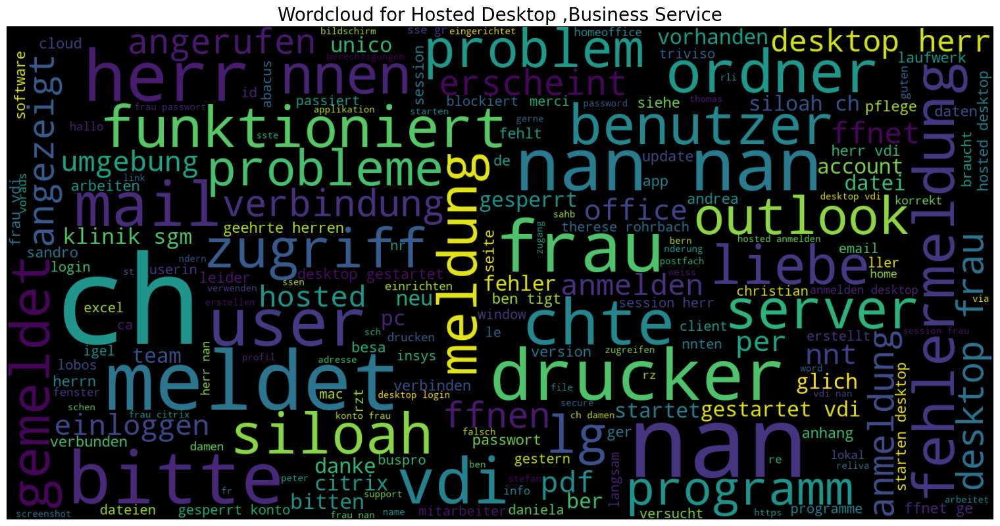

Hosted Desktop
Hosted Desktop


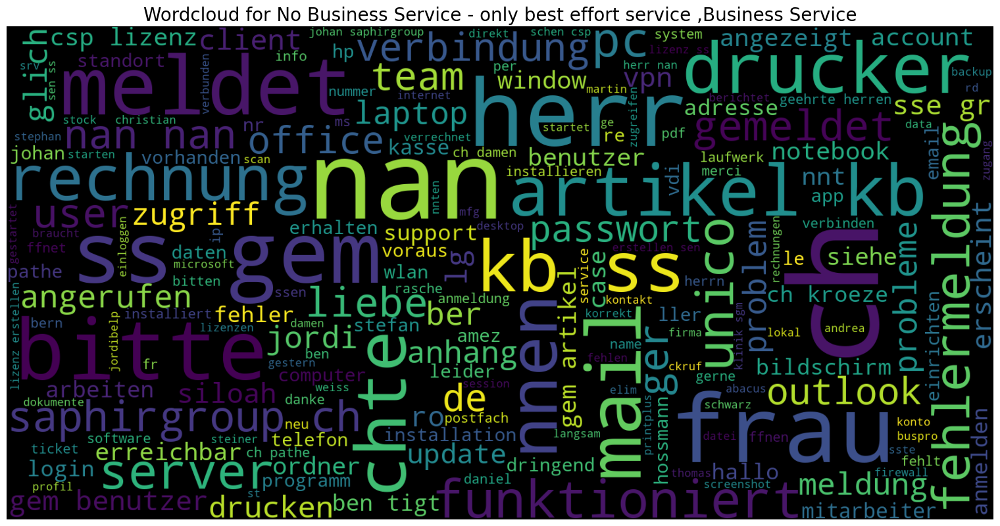

No Business Service - only best effort service
No Business Service - only best effort service


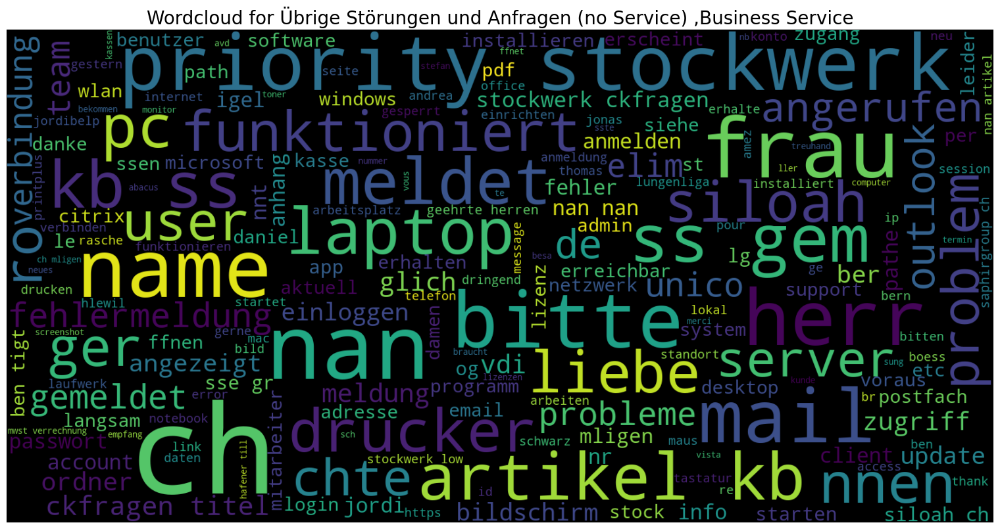

Übrige Störungen und Anfragen (no Service)
Übrige Störungen und Anfragen (no Service)


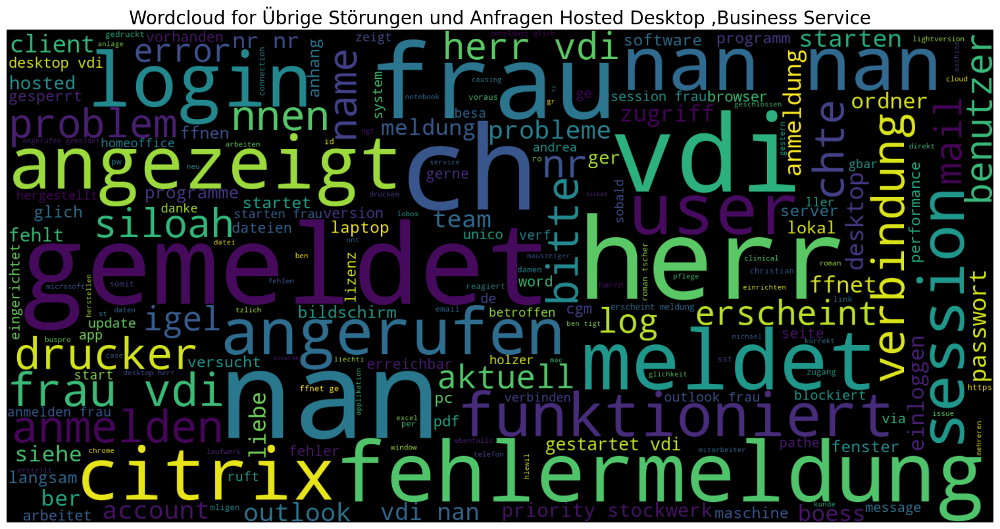

Übrige Störungen und Anfragen Hosted Desktop
Übrige Störungen und Anfragen Hosted Desktop


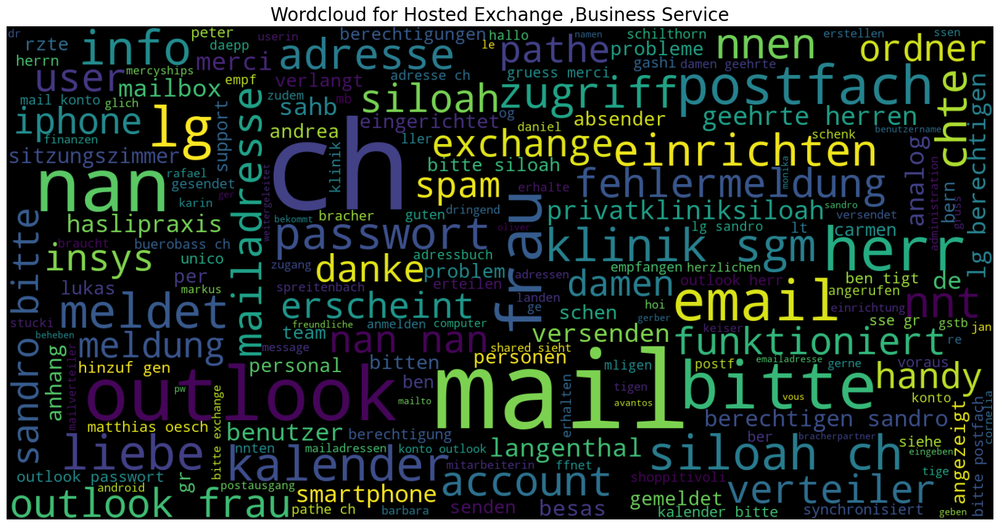

Hosted Exchange
Hosted Exchange


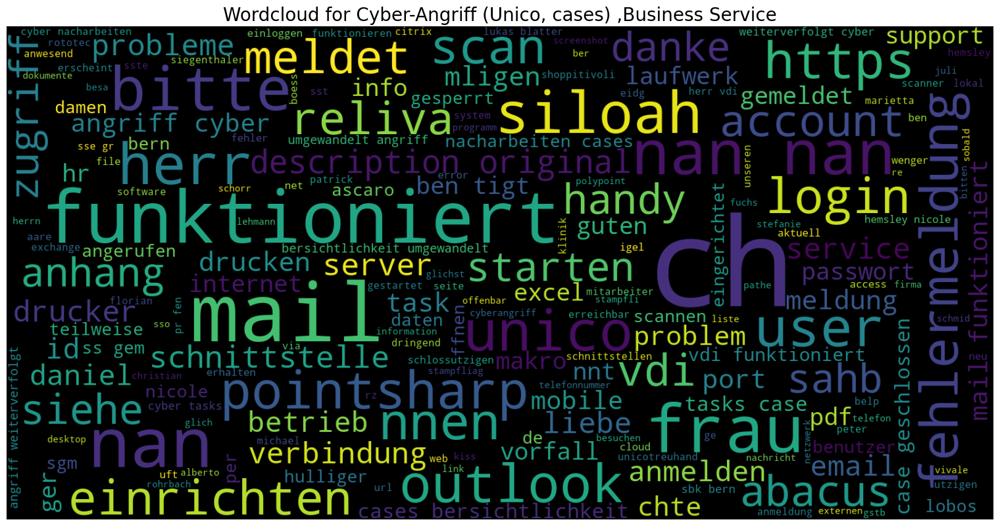

Cyber-Angriff (Unico, cases)
Cyber-Angriff (Unico, cases)


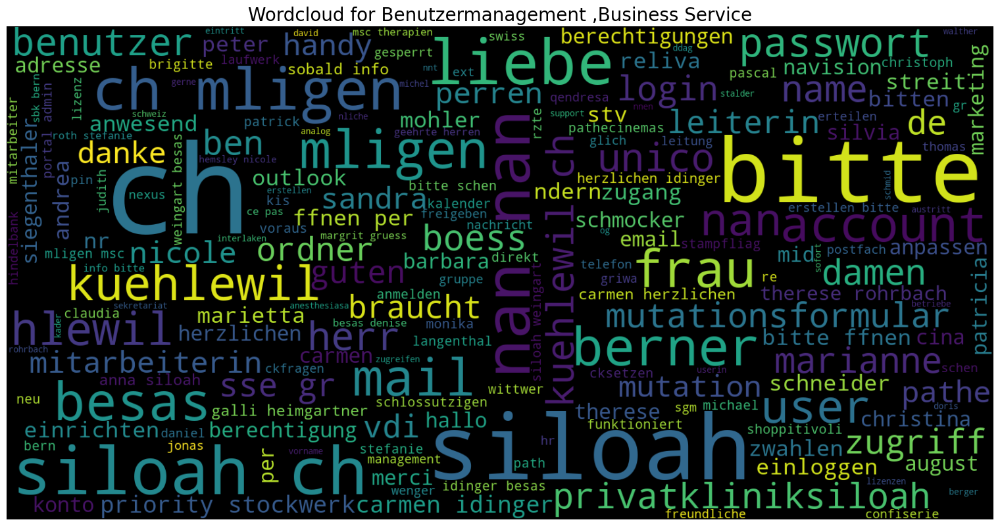

Benutzermanagement
Benutzermanagement


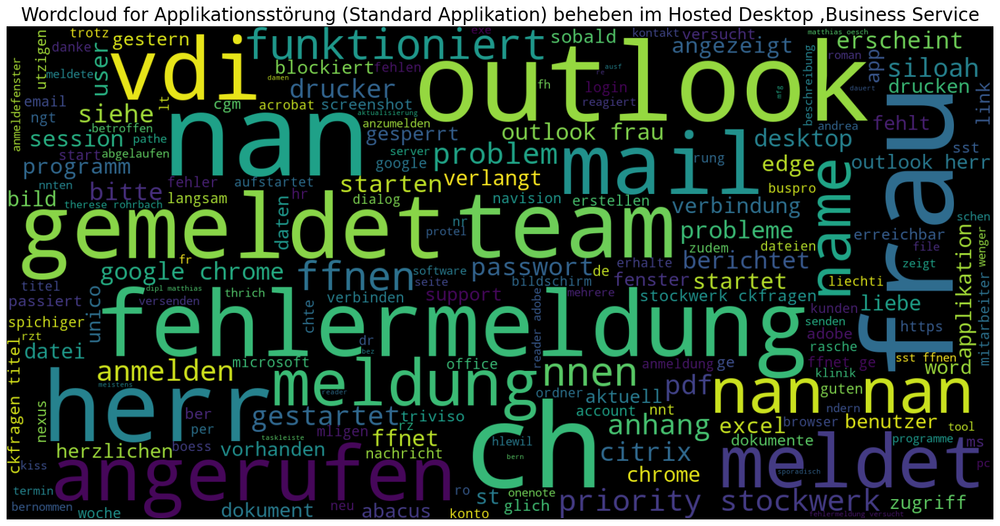

Applikationsstörung (Standard Applikation) beheben im Hosted Desktop
Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


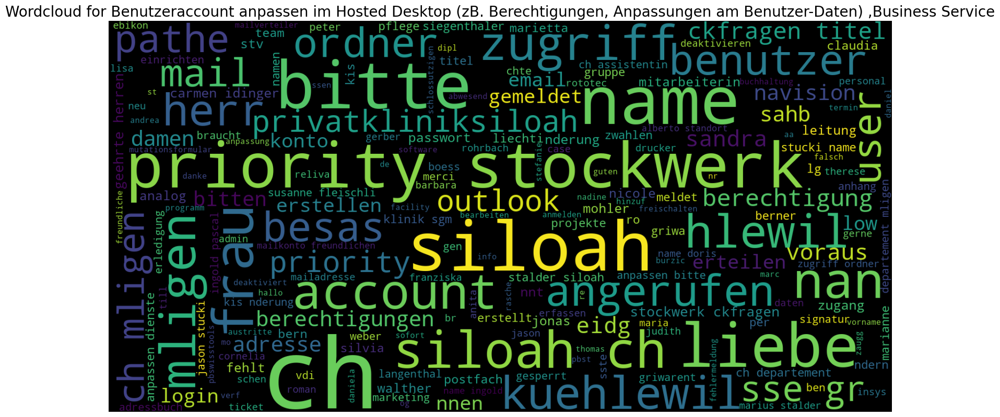

Benutzeraccount anpassen im Hosted Desktop (zB. Berechtigungen, Anpassungen am Benutzer-Daten)
Benutzeraccount anpassen im Hosted Desktop (zB. Berechtigungen, Anpassungen am Benutzer-Daten)


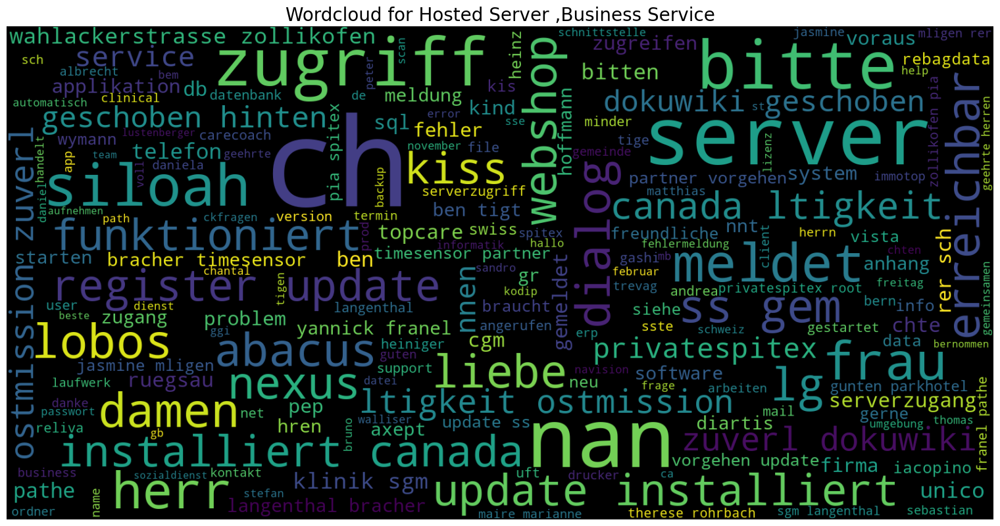

Hosted Server
Hosted Server


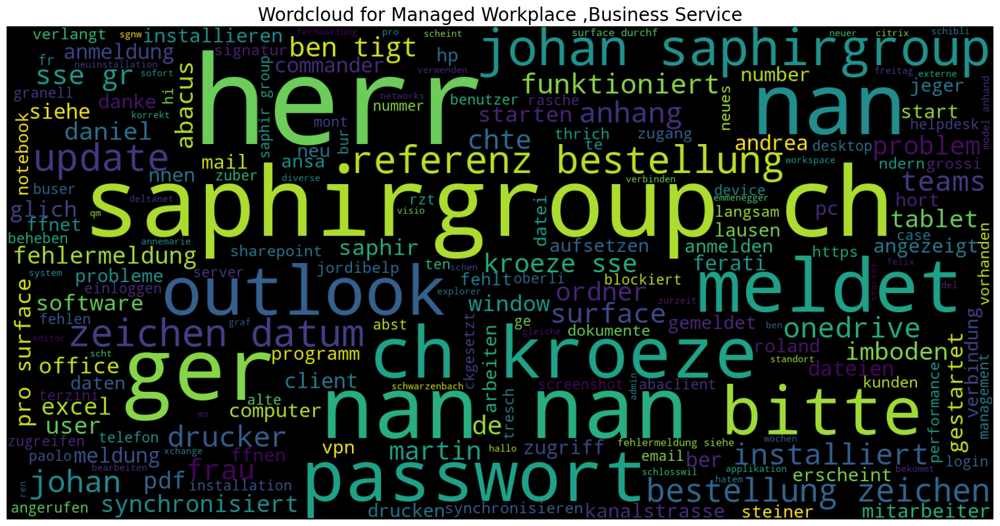

Managed Workplace
Managed Workplace


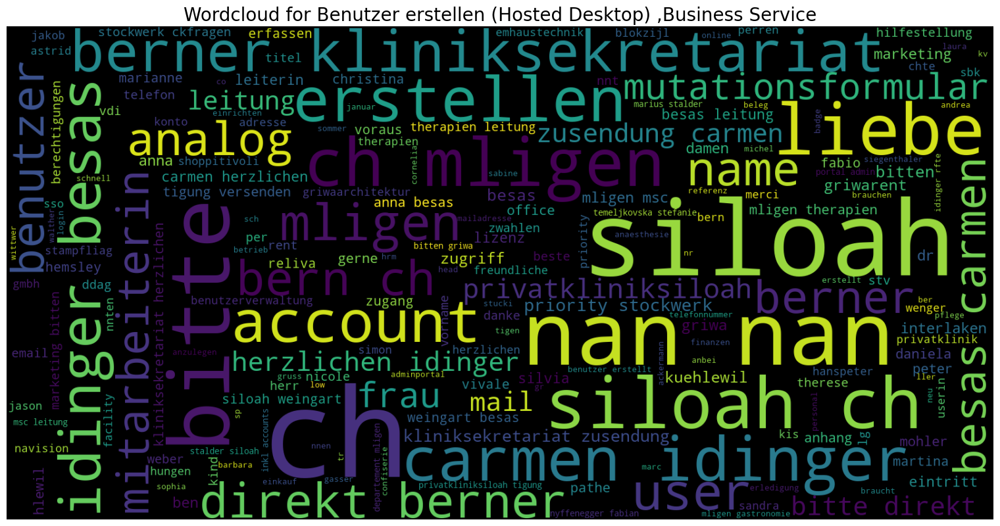

Benutzer erstellen (Hosted Desktop)
Benutzer erstellen (Hosted Desktop)


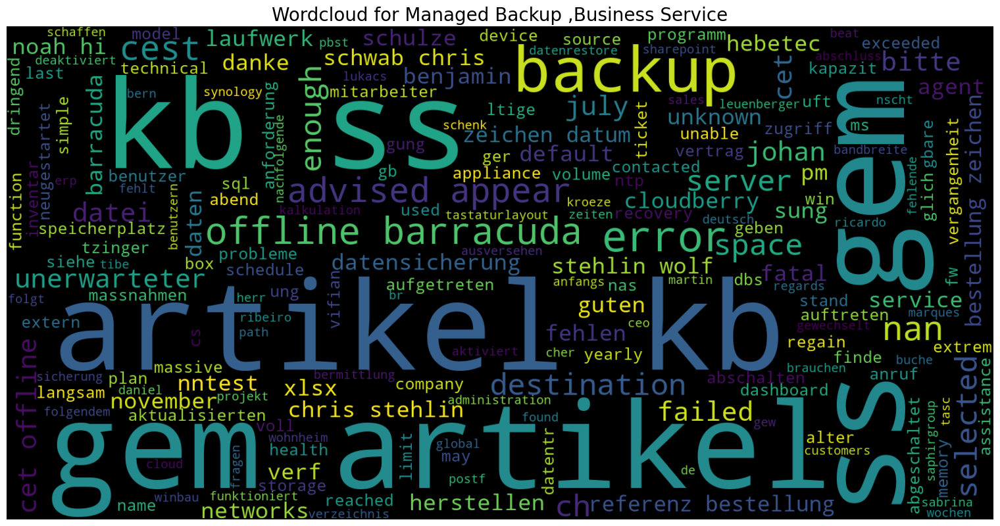

Managed Backup
Managed Backup


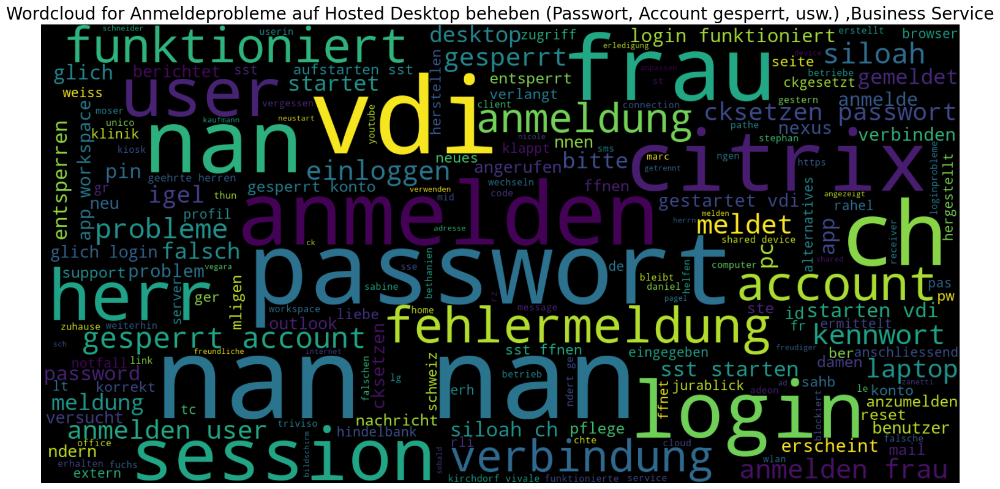

Anmeldeprobleme auf Hosted Desktop beheben (Passwort, Account gesperrt, usw.)
Anmeldeprobleme auf Hosted Desktop beheben (Passwort, Account gesperrt, usw.)


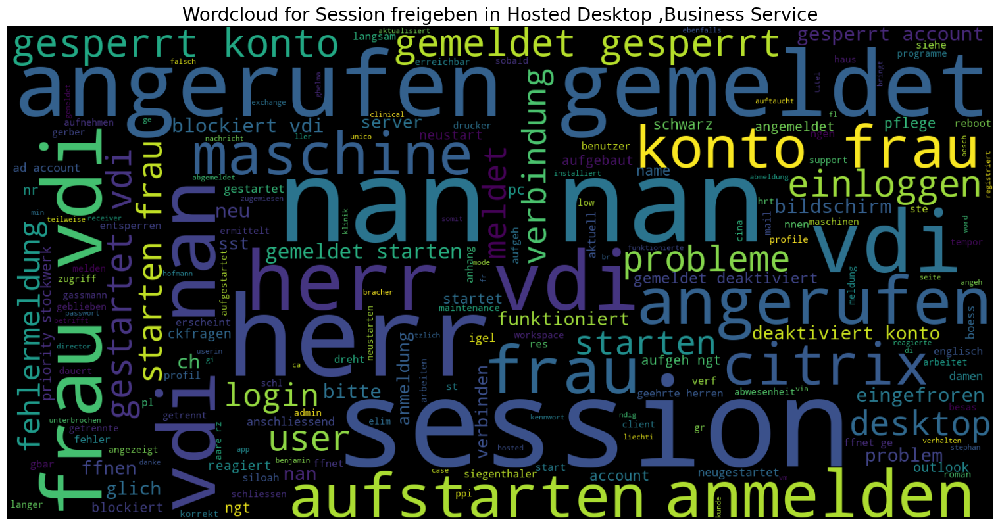

Session freigeben in Hosted Desktop
Session freigeben in Hosted Desktop


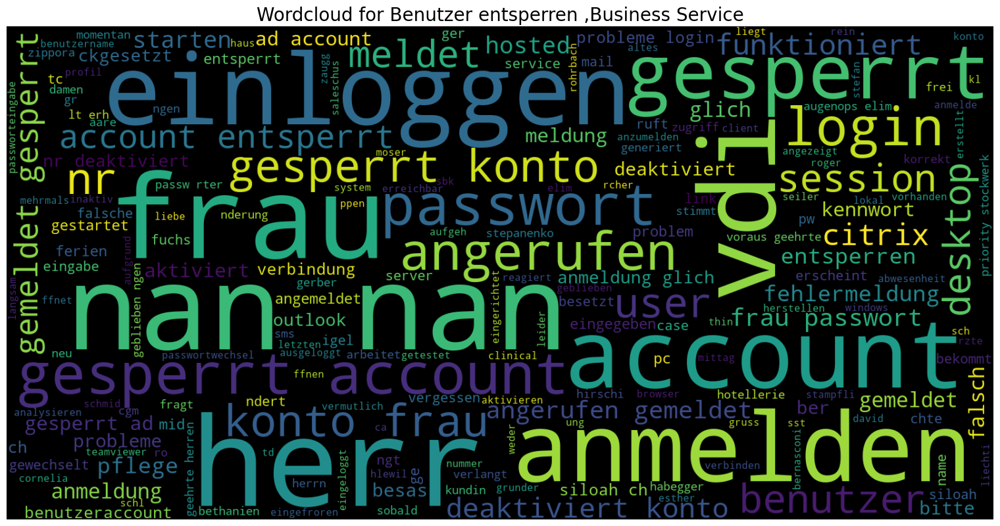

Benutzer entsperren
Benutzer entsperren


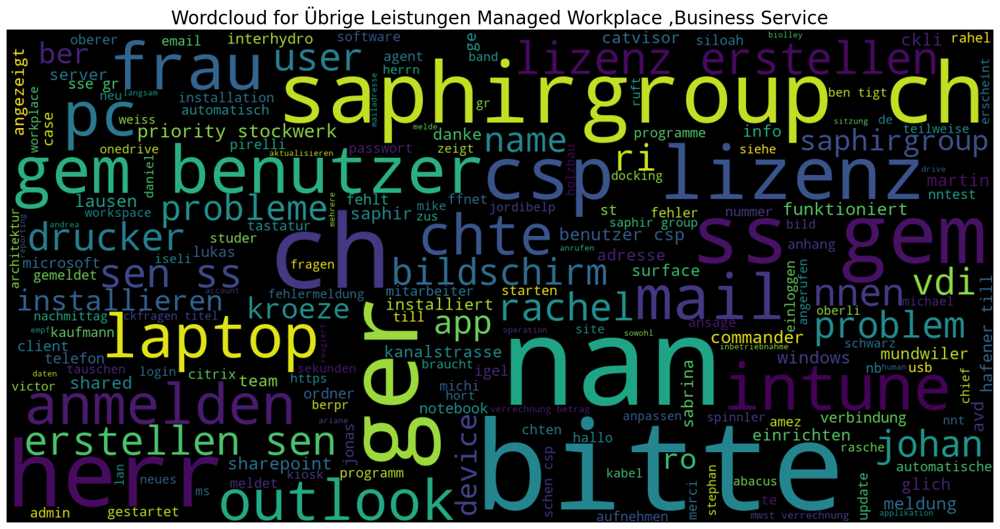

Übrige Leistungen Managed Workplace
Übrige Leistungen Managed Workplace


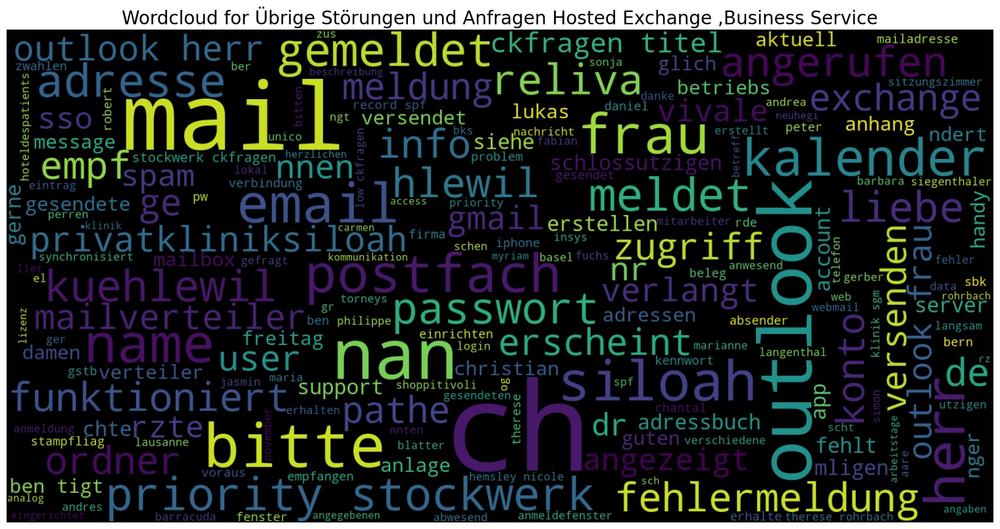

Übrige Störungen und Anfragen Hosted Exchange
Übrige Störungen und Anfragen Hosted Exchange


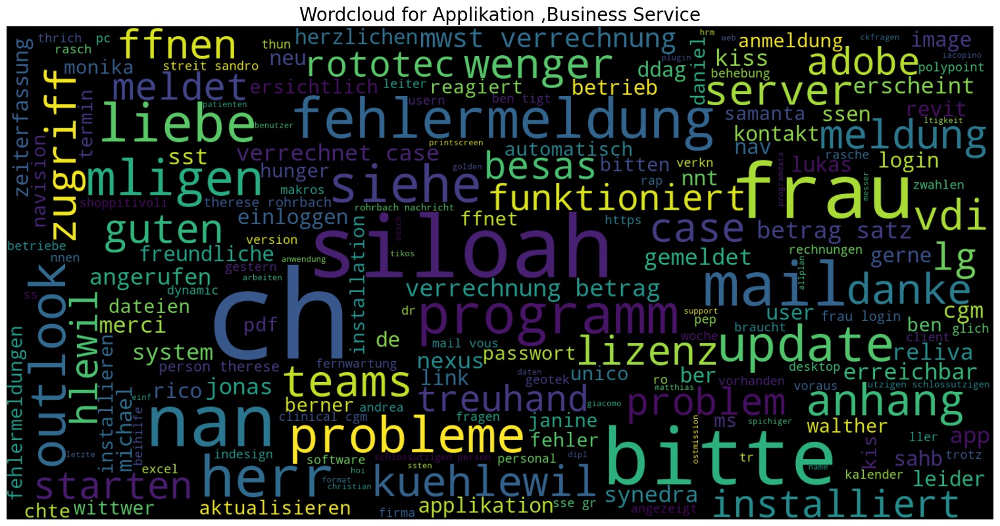

Applikation
Applikation


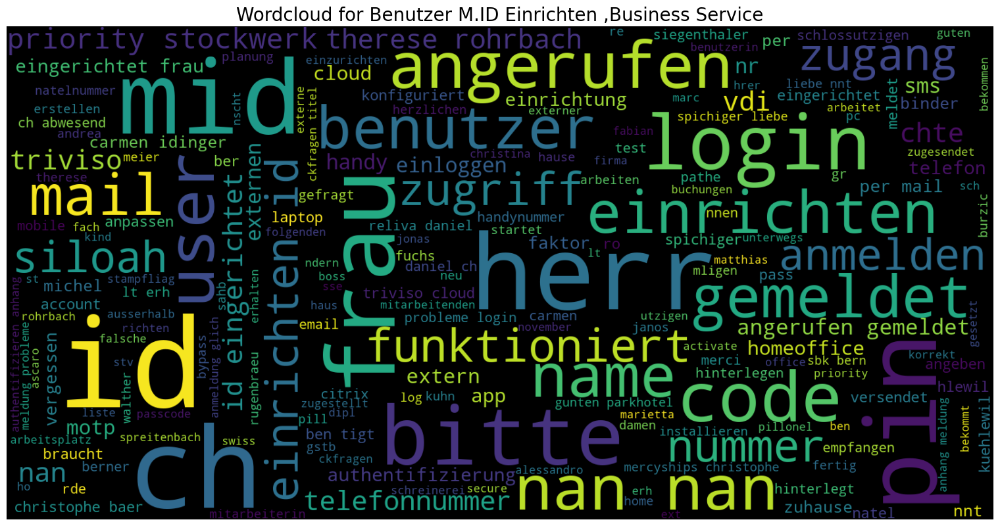

Benutzer M.ID Einrichten
Benutzer M.ID Einrichten


In [ ]:
def create_wordclouds(df, businessServiceFilter = None, plot_worldcloud=False):
    '''
    param df: dataframe (df_enhance = pd.read_parquet('Daten/Top50Words_OneHot_DataFrame.parquet'))
    businessServiceFilter: string (example: "skype")
    plot_worldcloud: boolean (default: False)
    
    '''

    # create copy of df
    df_enhance = df.copy()

    # filter for serviceangebotfilter
    if businessServiceFilter != None:
        df_enhance = df_enhance[df_enhance["business_service"] == businessServiceFilter]
    else:
        pass
    

    # filter from df the top 10 words each ticket and turn into list 
    vorcab = np.array(df_enhance["top_10_words_each_ticket_description"].to_list()).reshape(-1, 1)

    # convert vorcab into DataFrame
    df_vorcab = pd.DataFrame(vorcab)
    # rename column from new created dataframe
    df_vorcab.columns = ["top_10_words_each_ticket_description"]

    # filter with regex, not numbers 
    df_vorcab = df_vorcab[(df_vorcab["top_10_words_each_ticket_description"].str.contains(r'[0-9]') == False)]
    # filter with regex, if none remove
    df_vorcab = df_vorcab[df_vorcab["top_10_words_each_ticket_description"] != "none"]

    worldclouds_list = df_vorcab["top_10_words_each_ticket_description"].to_list()  

    # create with worldclouds_list a string a worldcloud
    worldclouds_string = " ".join(worldclouds_list)

    # create wordcloud
    wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(worldclouds_string)

    if plot_worldcloud:
        # plot wordcloud
        # set to white background
        # add title 

        plt.figure(figsize=(15,20), facecolor='white', edgecolor='blue')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f"Wordcloud for {businessServiceFilter} ,Business Service" , fontsize=20)
        plt.axis("off")
        plt.tight_layout(pad=0)
        plt.show()
        # save wordcloud as png
        # import re
        import re
        print(businessServiceFilter)
        # replace everhy non character with _ in serviceangebotfilter
        businessServiceFilter_string = re.sub(r'\W+', '', businessServiceFilter)
        print(businessServiceFilter)
        wordcloud.to_file(f"wordcloud/{businessServiceFilter_string}.png")


print("Top20 words for business_service")
df_enhance.business_service.value_counts().reset_index().iloc[:20, 0].to_list()

# iterate through top 20 serviceangebot

for business_service in df_enhance.business_service.value_counts().reset_index().iloc[:20, 0].to_list():
    create_wordclouds(df_enhance, businessServiceFilter=business_service, plot_worldcloud=True)
    # export wordclouds as png  